# Setup

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import os

from utils.connect import POSTGRES_ENGINE
from utils.sql import execute_sql
from utils.connect import SQL_PATH

In [3]:
EXCLUDE_SEQ_ICU = True
EXCLUDE_SEQ_HOSP = True

# Joining Data for Analysis

## Importing Data

In [6]:
# import each dataframe in the data directory
data_dir = "data/"
data = {}
 
for df in os.listdir(data_dir):
    if df.endswith(".csv"):
        try:
            data[df.replace(".csv", "")] = pd.read_csv(os.path.join(data_dir, df), parse_dates=["charttime"])
        except ValueError:
            try:
                data[df.replace(".csv", "")] = pd.read_csv(os.path.join(data_dir, df), parse_dates=["starttime", "endtime"])
            except ValueError: # no time col (e.g. demographics)
                data[df.replace(".csv", "")] = pd.read_csv(os.path.join(data_dir, df))
                
def convert_datime_cols(df: pd.DataFrame) -> pd.DataFrame:
    """Converts columns with "time" in the name to datetime."""
    for col in df.columns:
        if "time" in col:
            df[col] = pd.to_datetime(df[col])
    return df

def set_indices(df: pd.DataFrame) -> pd.DataFrame:
    """Sets index to stay_id or subject_id and charttime or starttime."""
    sample_indicator = "stay_id" if "stay_id" in df.columns else "subject_id"
    time_indicator = "charttime" if "charttime" in df.columns else "starttime"
    try:
        df = df.set_index([sample_indicator, time_indicator])
        # drop duplicated index
        df = df[~df.index.get_level_values(1).duplicated(keep="first")]
        return df
    except KeyError: # demographics
        return df.set_index(sample_indicator)

    

for df in data:
    data[df] = convert_datime_cols(data[df]) # convert columns to datetime
    data[df] = set_indices(data[df]) # set index to stay_id/subject_id and charttime/starttime

In [7]:
data['uo']

urineoutput
stay_id  charttime                       
30000153 2174-09-29 12:12:00        280.0
         2174-09-29 14:00:00         45.0
         2174-09-29 15:00:00         50.0
         2174-09-29 16:00:00         50.0
         2174-09-29 17:00:00         45.0
...                                   ...
39999810 2115-12-01 01:20:00        200.0
         2115-12-01 06:40:00        125.0
         2115-12-02 18:06:00        600.0
         2115-12-04 06:50:00        350.0
         2115-12-04 22:21:00          0.0

[1146194 rows x 1 columns]

In [98]:
# keep only rows with hosp_stay_seq and icustay_seq == 1
if EXCLUDE_SEQ_ICU:
    data["demographics"] = data["demographics"][data["demographics"]["icustay_seq"] == 1]
if EXCLUDE_SEQ_HOSP:
    data["demographics"] = data["demographics"][data["demographics"]["hospstay_seq"] == 1]

patient_subject_ids = patient_ids = data["demographics"].subject_id.unique()
patient_stay_ids = data["demographics"].index.unique()
 
# drop all rows not in patient_ids
for df in data:
    if df != "demographics":
        if data[df].index.names[0] == "stay_id":
            print(f"{df} Shape before: {data[df].shape}")
            data[df] = data[df].loc[data[df].index.get_level_values(0).isin(patient_stay_ids)]
            print(f"{df} Shape after: {data[df].shape}")
        else:
            print(f"{df} Shape before: {data[df].shape}")
            data[df] = data[df].loc[data[df].index.get_level_values(0).isin(patient_subject_ids)]
            print(f"{df} Shape after: {data[df].shape}")

ventilation_settings Shape before: (661313, 9)
ventilation_settings Shape after: (452346, 9)
norepinephrine Shape before: (351069, 3)
norepinephrine Shape after: (216852, 3)
creatinine Shape before: (587699, 1)
creatinine Shape after: (375344, 1)
uo Shape before: (1146194, 1)
uo Shape after: (794215, 1)
crp Shape before: (122930, 1)
crp Shape after: (37575, 1)
enzyme Shape before: (1584204, 3)
enzyme Shape after: (774975, 3)
coagulation Shape before: (1529038, 4)
coagulation Shape after: (987279, 4)
vitalsign Shape before: (4245609, 13)
vitalsign Shape after: (2841976, 13)
dobutamine Shape before: (8865, 3)
dobutamine Shape after: (4886, 3)
epinephrine Shape before: (25619, 3)
epinephrine Shape after: (16969, 3)
dopamine Shape before: (17700, 3)
dopamine Shape after: (12300, 3)
blood_count Shape before: (3087733, 4)
blood_count Shape after: (1617919, 4)
chemistry Shape before: (3209331, 3)
chemistry Shape after: (1711631, 3)
phenylephyrine Shape before: (201928, 3)
phenylephyrine Shape

## Validate Process on Single Entity

In [99]:
data['demographics'].loc[37510196]

subject_id                        10001884
hadm_id                           26184834
gender                                   F
date_of_death                   2131-01-20
admittime              2131-01-07 20:39:00
dischtime              2131-01-20 05:15:00
admission_age                    77.018296
ethnicity           BLACK/AFRICAN AMERICAN
hospstay_seq                             1
icu_intime             2131-01-11 04:20:05
icu_outtime            2131-01-20 08:27:30
icustay_seq                              1
height                               157.0
admission_weight                      65.0
Name: 37510196, dtype: object

In [100]:
STAY_ID = 37510196
SUBJECT_ID = 10001884

single_data = {}

for df in data:
    try:
        single_data[df] = data[df].loc[STAY_ID]
    except KeyError:
        print(f"KeyError: stay_id {STAY_ID} not in {df}")
        try:
            single_data[df] = data[df].loc[SUBJECT_ID]
        except KeyError:
            print(f"KeyError: subject_id {SUBJECT_ID} not in {df}")
            pass
        
    
single_data["demographics"]

KeyError: stay_id 37510196 not in norepinephrine
KeyError: subject_id 10001884 not in norepinephrine
KeyError: stay_id 37510196 not in crp
KeyError: subject_id 10001884 not in crp
KeyError: stay_id 37510196 not in enzyme
KeyError: stay_id 37510196 not in coagulation
KeyError: stay_id 37510196 not in dobutamine
KeyError: subject_id 10001884 not in dobutamine
KeyError: stay_id 37510196 not in epinephrine
KeyError: subject_id 10001884 not in epinephrine
KeyError: stay_id 37510196 not in blood_count
KeyError: stay_id 37510196 not in chemistry
KeyError: stay_id 37510196 not in phenylephyrine
KeyError: subject_id 10001884 not in phenylephyrine
KeyError: stay_id 37510196 not in milrinone
KeyError: subject_id 10001884 not in milrinone


subject_id                        10001884
hadm_id                           26184834
gender                                   F
date_of_death                   2131-01-20
admittime              2131-01-07 20:39:00
dischtime              2131-01-20 05:15:00
admission_age                    77.018296
ethnicity           BLACK/AFRICAN AMERICAN
hospstay_seq                             1
icu_intime             2131-01-11 04:20:05
icu_outtime            2131-01-20 08:27:30
icustay_seq                              1
height                               157.0
admission_weight                      65.0
Name: 37510196, dtype: object

In [101]:
data["demographics"].loc[data["demographics"]["subject_id"] == 10001884]

,subject_id,hadm_id,gender,date_of_death,admittime,dischtime,admission_age,ethnicity,hospstay_seq,icu_intime,icu_outtime,icustay_seq,height,admission_weight
stay_id,,,,,,,,,,,,,,
37510196,10001884,26184834,F,2131-01-20,2131-01-07 20:39:00,2131-01-20 05:15:00,77.018296,BLACK/AFRICAN AMERICAN,1,2131-01-11 04:20:05,2131-01-20 08:27:30,1,157.0,65.0


In [102]:
single_data['demographics'].icu_intime

Timestamp('2131-01-11 04:20:05')

In [103]:
test_icu_intime = single_data['demographics'].icu_intime
test_icu_outtime = single_data['demographics'].icu_outtime

In [104]:
# drop all values outside of icu intime and outtime
single_data['uo'] = single_data['uo'].loc[(single_data['uo'].index >= test_icu_intime) & (single_data['uo'].index <= test_icu_outtime)]
single_data['blood_count'] = single_data['blood_count'].loc[(single_data['blood_count'].index >= test_icu_intime) & (single_data['blood_count'].index <= test_icu_outtime)]

In [105]:
single_data['uo']

,urineoutput
charttime,
2131-01-11 09:35:00,100.0
2131-01-15 09:10:00,60.0
2131-01-15 11:09:00,60.0
2131-01-15 18:03:00,35.0
2131-01-17 07:34:00,75.0
2131-01-17 08:19:00,80.0
2131-01-17 10:22:00,265.0
2131-01-17 12:04:00,130.0
2131-01-17 14:17:00,75.0


In [106]:
single_data["uo"].resample('1H').sum()

,urineoutput
charttime,
2131-01-11 09:00:00,100.0
2131-01-11 10:00:00,0.0
2131-01-11 11:00:00,0.0
2131-01-11 12:00:00,0.0
2131-01-11 13:00:00,0.0
...,...
2131-01-18 11:00:00,0.0
2131-01-18 12:00:00,0.0
2131-01-18 13:00:00,0.0


In [107]:
test_uo = single_data['uo']["urineoutput"].resample('1H').sum()

In [108]:
single_data['blood_count']

,hematocrit,hemoglobin,platelet,wbc
charttime,,,,
2131-01-11 06:31:00,36.0,11.4,171.0,18.4
2131-01-12 03:34:00,33.6,10.4,149.0,12.0
2131-01-13 04:29:00,33.4,10.2,144.0,17.1
2131-01-14 03:08:00,26.7,8.3,119.0,11.9
2131-01-14 06:00:00,26.6,8.3,106.0,11.7
2131-01-14 15:30:00,28.5,9.0,117.0,12.6
2131-01-14 23:00:00,26.3,8.2,103.0,11.8
2131-01-15 02:30:00,26.4,8.1,109.0,12.1
2131-01-15 15:00:00,26.1,8.2,103.0,10.7


In [109]:
single_data['blood_count'].resample('1H', closed='right').ffill()

,hematocrit,hemoglobin,platelet,wbc
charttime,,,,
2131-01-11 07:00:00,36.0,11.4,171.0,18.4
2131-01-11 08:00:00,36.0,11.4,171.0,18.4
2131-01-11 09:00:00,36.0,11.4,171.0,18.4
2131-01-11 10:00:00,36.0,11.4,171.0,18.4
2131-01-11 11:00:00,36.0,11.4,171.0,18.4
...,...,...,...,...
2131-01-19 01:00:00,23.9,7.4,169.0,13.1
2131-01-19 02:00:00,23.9,7.4,169.0,13.1
2131-01-19 03:00:00,23.9,7.4,169.0,13.1


In [110]:
test_bc = single_data['blood_count'].resample('1H', closed='right').ffill()

In [111]:
test_merged = pd.merge(test_uo, test_bc, how='outer', left_index=True, right_index=True)
test_merged.tail(50)

,urineoutput,hematocrit,hemoglobin,platelet,wbc
charttime,,,,,
2131-01-17 04:00:00,0.0,24.8,7.7,142.0,11.7
2131-01-17 05:00:00,0.0,23.9,7.3,139.0,11.4
2131-01-17 06:00:00,0.0,23.9,7.3,139.0,11.4
2131-01-17 07:00:00,75.0,23.9,7.3,139.0,11.4
2131-01-17 08:00:00,80.0,23.9,7.3,139.0,11.4
2131-01-17 09:00:00,0.0,23.9,7.3,139.0,11.4
2131-01-17 10:00:00,265.0,23.9,7.3,139.0,11.4
2131-01-17 11:00:00,0.0,23.9,7.3,139.0,11.4
2131-01-17 12:00:00,130.0,23.9,7.3,139.0,11.4


In [112]:
test_merged.fillna(method='ffill', inplace=True)

In [113]:
test_merged

,urineoutput,hematocrit,hemoglobin,platelet,wbc
charttime,,,,,
2131-01-11 07:00:00,NaN,36.0,11.4,171.0,18.4
2131-01-11 08:00:00,NaN,36.0,11.4,171.0,18.4
2131-01-11 09:00:00,100.0,36.0,11.4,171.0,18.4
2131-01-11 10:00:00,0.0,36.0,11.4,171.0,18.4
2131-01-11 11:00:00,0.0,36.0,11.4,171.0,18.4
...,...,...,...,...,...
2131-01-19 01:00:00,240.0,23.9,7.4,169.0,13.1
2131-01-19 02:00:00,240.0,23.9,7.4,169.0,13.1
2131-01-19 03:00:00,240.0,23.9,7.4,169.0,13.1


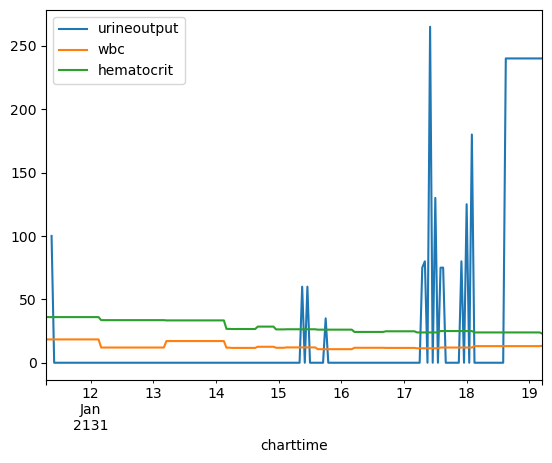

In [114]:
test_merged[["urineoutput", "wbc", "hematocrit"]].plot()
plt.show()

# Modularize

## Excluding Values not in ICU Stay

In [116]:
def exclude_values_outside_icu_intime_outtime(target_df:pd.DataFrame, demographics_df: pd.DataFrame) -> pd.DataFrame:
    """
    Exclude values outside of icu intime and outtime. Either use stay_id or subject_id as index level 0 and charttime or starttime as index level 1.
    """
    missing_count = []
    for patient in demographics_df.index.unique():
        icu_intime = demographics_df.loc[patient].icu_intime
        icu_outtime = demographics_df.loc[patient].icu_outtime
        subject_id = demographics_df.loc[patient].subject_id
        try:
            target_df.loc[patient] = target_df.loc[patient][
                (target_df.loc[patient].index >= icu_intime)
                & (target_df.loc[patient].index <= icu_outtime)
            ].copy()
        except KeyError:
            try:
                target_df.loc[subject_id] = target_df.loc[subject_id][
                    (target_df.loc[subject_id].index >= icu_intime)
                    & (target_df.loc[subject_id].index <= icu_outtime)
                ].copy()
            except KeyError:
                missing_count.append(patient)
                pass  # patient not in target_df
    return target_df, missing_count
    
def resample(target_df, resample_freq):
    """
    Resample the data to the specified frequency.
    """
    return target_df.resample(resample_freq).ffill()

# def join_data(data, demographics, resample_freq="1H", resample_method=pd.DataFrame.resample.ffill):
#     """
#     Join the data into a single dataframe.
#     """
#     # exclude values outside of icu intime and outtime
#     data = exclude_values_outside_icu_intime_outtime(data, demographics)
#     # resample the data
#     data = resample(data, resample_freq, resample_method)
#     # join the data
#     return pd.merge(data, demographics, how="outer", left_on="stay_id", right_on="stay_id")

missing_count = {}
for df in data:
    if df != "demographics":
        print(df)
        data[df], missing_count[df] = exclude_values_outside_icu_intime_outtime(data[df], data["demographics"])
        print(f"Missing count: {len(missing_count[df])}")
        print("++++++++++++++++++++++" * 5)
        



ventilation_settings
Missing count: 26739
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
norepinephrine
Missing count: 44937
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
creatinine
Missing count: 1422
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
uo


/var/folders/70/_kzl44wj5hv4tkqjfdkcmjdr0000gn/T/ipykernel_39931/534326876.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  target_df.loc[patient] = target_df.loc[patient][
/var/folders/70/_kzl44wj5hv4tkqjfdkcmjdr0000gn/T/ipykernel_39931/534326876.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  target_df.loc[patient] = target_df.loc[patient][
/var/folders/70/_kzl44wj5hv4tkqjfdkcmjdr0000gn/T/ipykernel_39931/534326876.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/inde

Missing count: 3937
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
crp
Missing count: 42057
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
enzyme
Missing count: 4916
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
coagulation
Missing count: 984
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
vitalsign
Missing count: 20
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
dobutamine
Missing count: 52926
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
epinephrine
Missing count: 51172
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
dopamine
Missing count: 521